# 一行代码处理kits19数据集
* 一行代码肾脏可视化（三视图）
* 一行代码读取3D图像和标注
* 一行代码统计像素值方差、均值、数量和比例
* 一行代码进行重采样并保存
* 一行代码分析前景位置信息
* 一行代码获取肾脏3D patch

使用代码前确保已安装如下packages：
* nibabel
* numpy
* scipy
* sklearn
* matplotlib

Kits19数据集目录结构如下所示，以下示例均使用`data`目录作为数据根目录。
```bash
─kits19
  ├─data
  │  ├─case_00000
  │  ├─case_00001
  │  ├─case_00002
  │  ├─case_00003
  │  │  ├─imaging.nii.gz
  │  │  ├─segmentation.nii.gz

```


In [1]:
from kits19tools import *
data_dir="D:/kits19/data"

## 读取3D图像和标注

获取图像数据使用`get_imgaging(data_dir,case_id)`

获取标注数据使用`get_segmentation(data_dir,case_id)`

返回类型均为`Nifti1Image`,使用方法`get_data(img_or_seg)`获取其中数据,返回类型为`ndarray`

In [2]:
case_id=10
img=get_imaging(data_dir,case_id)
seg=get_segmentation(data_dir,case_id)
print(type(img),type(seg))
img_data=get_data(img)
print(type(img_data))
print(img_data.shape)


<class 'nibabel.nifti1.Nifti1Image'> <class 'nibabel.nifti1.Nifti1Image'>
<class 'numpy.ndarray'>
(50, 512, 512)


## 两肾可视化
visualization(data_dir,case_id,resample_1_1,clip)
`data_dir`为数据集根目录

`case_id`为病例id

`resample_1_1`是否按照`d:w:h=1:1:1`可视化

`clip=array([val_min,val_max])`为像素值截断区间

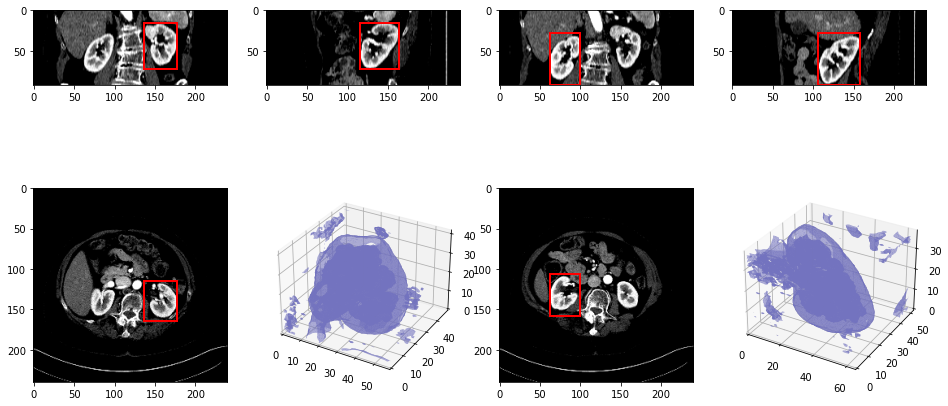

In [3]:
visualization(data_dir,case_id,resample_1_1=True,clip=array([-30,280]))

## 获取图像信息
* 3D图像数组大小:`get_size()`
* 体素间距（mm）:`get_spacing()`

In [4]:
size=get_size(img)
space=get_spacing(img)
print(size,space)

[ 50 512 512] [3.        0.7578125 0.7578125]


## 分析前景位置信息并获取3D patch

* 前景3D切片范围（一个立方体，同时包含两个肾脏和肿瘤）
* 肾脏和肿瘤3D切片范围（两个立方体，包含两个肾脏的立方体和包含所有肿瘤的立方体）
* 左右肾脏3D切片范围（两个立方体，分别为左右两肾）
* 左右两肾脏的质心坐标

In [5]:
print("front",analyze_cube(seg))
for cube,name in zip(analyze_cubes(seg),["kidney","tumour"]):
    print(name,cube)

for i,center in enumerate(analyze_kidney_center(seg)):
    print("kidney %d center"%i,center)

kidneys,centers=analyze_kidney(seg)
for i,(kidney,center) in enumerate(zip(kidneys,centers)):
    print("kidney %o center"%i,center,"range",kidney)


front (slice(9, 50, None), slice(226, 352, None), slice(132, 380, None))
kidney (slice(9, 50, None), slice(226, 352, None), slice(132, 380, None))
tumour (slice(10, 20, None), slice(265, 311, None), slice(290, 331, None))
kidney 0 center [ 22 296 337]
kidney 1 center [ 31 280 170]
kidney 0 center [ 31 280 170] range (slice(15, 49, None), slice(226, 339, None), slice(132, 214, None))
kidney 1 center [ 22 296 337] range (slice(9, 39, None), slice(246, 351, None), slice(290, 379, None))


可直接使用返回的`cube`获得3D patch

In [6]:
for kidney in kidneys:
    img_kidney=img_data[kidney]
    print(img_kidney.shape)

(34, 113, 82)
(30, 105, 89)


## 重采样

In [7]:
space=array([1.62,1.62,1.62])

img_size=get_size(img)
seg_size=get_size(seg)

img_space=get_spacing(img)
seg_space=get_spacing(seg)

print("img",img_size,img_space)
print("seg",seg_size,seg_space)

img_resample=resample_image(img,space)
seg_resample=resample_segmentation(seg,space)

img_size=get_size(img_resample)
seg_size=get_size(seg_resample)

img_space=get_spacing(img_resample)
seg_space=get_spacing(seg_resample)

print("img",img_size,img_space)
print("seg",seg_size,seg_space)

img_data=img.get_fdata()
print(img_data.shape)
space_new=array([3,3,3])
img_data_resample=resample_arrray(img_data,img_space,space_new)
print(img_data_resample.shape)

img [ 50 512 512] [3.        0.7578125 0.7578125]
seg [ 50 512 512] [3.        0.7578125 0.7578125]
img [ 93 240 240] [1.62 1.62 1.62]
seg [ 93 240 240] [1.62 1.62 1.62]
(50, 512, 512)
(27, 276, 276)


## 保存重采样图像和标注

In [8]:
path_sample="D:/tmp/"

save_imaging(path_sample,case_id,img)
save_segmentation(path_sample,case_id,seg)

## 数据集重采样示例
* 将数据集（病例id 0-209）重采样至3.22 mm, 1.62 mm, 1.62 mm,并保存到`resample`目录
* 统计重采样后各肾脏立方体顶点坐标

In [ ]:
def save_json(obj,data_dir:str):
    with open(join(data_dir,"kidney_ranges.json"),"w") as f:
        json.dump(obj,f)

def resample(path_origin:str,path_resample:str,case_range:range,target_spacing:ndarray=array([[3.22,1.62,1.62]])):
    if not exists(path_resample):
        makedirs(path_resample)
    ranges=[]
    for case_id in case_range:
        print("resampling %05d..."%case_id)
        img=get_imaging(path_origin,case_id)
        seg=get_segmentation(path_origin,case_id)
        img_resample=resample_image(img)
        seg_resample=resample_segmentation(seg)
        kidneys,_=analyze_kidney(seg_resample)
        ranges.append([
            {
                "d_min":int(kidneys[0][0].start),
                "d_max":int(kidneys[0][0].stop),
                "w_min":int(kidneys[0][1].start),
                "w_max":int(kidneys[0][1].stop),
                "h_min":int(kidneys[0][2].start),
                "h_max":int(kidneys[0][2].stop),
            },
            {
                "d_min":int(kidneys[1][0].start),
                "d_max":int(kidneys[1][0].stop),
                "w_min":int(kidneys[1][1].start),
                "w_max":int(kidneys[1][1].stop),
                "h_min":int(kidneys[1][2].start),
                "h_max":int(kidneys[1][2].stop),
            },
        ])
        save_imaging(path_resample,case_id,img_resample)
        save_segmentation(path_resample,case_id,seg_resample)
    save_json(ranges,path_resample)



resample("D:/kits19/data","D:/kits19/resample",range(210))

## 统计像素均值、方差
* 统计单个病例
* 统计整个数据集

In [9]:
mean,std=analyze_mean_std(img)
print(mean,std)

-479.09187461853026 479.0315006505917


In [10]:
cases=list(range(30))
mean,std,nums=statistics(data_dir,cases)
print("mean:",mean)
print("std",std)
print("nums",nums)

mean: -527.8739892580843
std 2900307.079352456
nums 1766326272


## 统计不同分类像素点个数及比例
* counts:\[background,kidney,tumour\]
* radios:\[background,kidney,tumour\]

In [11]:
counts,radios=count_volume_pixel(data_dir,cases)
print(counts,radios)

[1.75328902e+09 1.15637000e+07 1.47354900e+06] [9.92619003e-01 6.54675197e-03 8.34245079e-04]
